In [220]:
import seaborn as sns
import folium
import folium.plugins as folium_plugins
import geopandas as gpd
import pandas as pd
from logging import warning
import matplotlib.pyplot as plt
import numpy as np

from utils.downloads import (
    Censo,
    Nivel,
    download_malha,
    download_dados,
)

In [2]:
sns.set_theme(rc={'figure.figsize':(11.7,8.27)})

# Carregamento dos dados

Primeiro, vamos carregar os dados das geometrias e de similaridade.

In [3]:
%%time
setores10 = download_malha(Censo.CENSO_2010, Nivel.SETORES)
setores10 = setores10[setores10['CD_GEOCODM'] == '3550308']
setores10 = setores10.to_crs(epsg=31983)
setores10.sample(3)

CPU times: user 18.2 s, sys: 836 ms, total: 19 s
Wall time: 20.3 s


,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry
47149,112717.0,355030823000075,URBANO,35503082300,None,355030823,CIDADE DUTRA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,47150,"POLYGON ((328326.804 7375752.823, 328327.768 7..."
48207,113685.0,355030827000134,URBANO,35503082700,None,355030827,CURSINO,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,48208,"POLYGON ((335602.592 7384741.400, 335595.903 7..."
60253,125821.0,355030885000034,URBANO,35503088500,None,355030885,VILA FORMOSA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,60254,"POLYGON ((341710.053 7392534.769, 341667.099 7..."


In [4]:
%%time
setores22 = download_malha(Censo.CENSO_2022, Nivel.SETORES)
setores22 = setores22[setores22['CD_MUN'] == '3550308']
setores22 = setores22.to_crs(epsg=31983)
setores22.sample(3)

CPU times: user 1min 8s, sys: 600 ms, total: 1min 8s
Wall time: 1min 8s


,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,CD_CONCURB,NM_CONCURB,v0001,v0002,v0003,v0004,v0005,v0006,v0007,geometry
92752,355030894000275P,0.007209,3,Sudeste,35,São Paulo,3550308,São Paulo,355030894,Vila Sônia,...,3550308,São Paulo/SP,590,273,273,0,2.218045,0.000000,266,"POLYGON ((322358.040 7389147.257, 322346.420 7..."
88331,355030877000279P,0.015030,3,Sudeste,35,São Paulo,3550308,São Paulo,355030877,Saúde,...,3550308,São Paulo/SP,101,59,59,0,2.244444,31.111111,45,"POLYGON ((332537.603 7386811.905, 332539.961 7..."
69913,355030819000270P,0.046387,3,Sudeste,35,São Paulo,3550308,São Paulo,355030819,Capão Redondo,...,3550308,São Paulo/SP,615,262,262,0,2.685590,8.733624,229,"POLYGON ((320675.337 7382398.067, 320664.107 7..."


In [5]:
sim_double_buff_resga_10_path = 'data/06_similarity_double_buffer_resga_10.parquet'
sim_double_buff_resga_10 = gpd.read_parquet(sim_double_buff_resga_10_path)
sim_double_buff_resga_10

,CD_GEOCODI,CD_SETOR,geometry,inter_area,inter_perc
557,355030804000079,355030804000079P,"MULTIPOLYGON (((344923.185 7391231.361, 344925...",27868.809593,1.000000
558,355030804000080,355030804000080P,"MULTIPOLYGON (((344852.331 7391245.510, 344855...",29099.528367,1.000000
559,355030804000081,355030804000081P,"MULTIPOLYGON (((344688.119 7391274.180, 344692...",17257.656772,1.000000
558,355030804000082,355030804000080P,"POLYGON ((344742.196 7391443.694, 344742.081 7...",3.674850,0.000137
560,355030804000082,355030804000082P,"MULTIPOLYGON (((344643.686 7391295.269, 344650...",26889.176795,0.999863
...,...,...,...,...,...
27476,355030896000246,355030896000227P,"POLYGON ((354771.973 7397966.378, 354814.526 7...",147.748258,0.025620
27494,355030896000246,355030896000245P,"POLYGON ((354750.848 7397978.475, 354780.511 7...",1669.246568,0.289455
27495,355030896000246,355030896000246P,"POLYGON ((354784.574 7397992.486, 354788.166 7...",3949.865171,0.684925
27446,355030896000247,355030896000193P,"POLYGON ((357430.206 7395524.645, 357430.202 7...",980.495123,0.096088


In [6]:
sim_double_buff_resga_22_path = 'data/06_similarity_double_buffer_resga.parquet'
sim_double_buff_resga_22 = gpd.read_parquet(sim_double_buff_resga_22_path)
sim_double_buff_resga_22

,CD_SETOR,CD_GEOCODI,geometry,inter_area,inter_perc
43400,355030801000001P,355030801000001,"MULTIPOLYGON (((339726.440 7392638.031, 339726...",54797.963347,1.000000
43401,355030801000002P,355030801000002,"MULTIPOLYGON (((339823.766 7392951.574, 339815...",56717.891680,0.999637
43403,355030801000002P,355030801000004,"POLYGON ((339823.766 7392951.574, 339825.861 7...",20.574768,0.000363
43401,355030801000003P,355030801000002,"POLYGON ((340063.467 7392874.480, 340063.496 7...",0.222867,0.000005
43402,355030801000003P,355030801000003,"MULTIPOLYGON (((340064.376 7392879.276, 340066...",41689.754272,0.999983
...,...,...,...,...,...
62367,355030896000337P,355030896000230,"POLYGON ((354261.180 7397329.839, 354257.310 7...",123.828312,0.002243
62240,355030896000338P,355030896000103,"POLYGON ((355570.830 7397714.789, 355571.654 7...",22.538290,0.000957
62241,355030896000338P,355030896000104,"MULTIPOLYGON (((355570.830 7397714.789, 355571...",23517.477521,0.999043
62240,355030896000339P,355030896000103,"MULTIPOLYGON (((355573.355 7397638.607, 355572...",5030.809286,0.730378


Adicionalmente, precisamos carregar os dados de população e domicílios do censo de 2010, que não vêm junto com a geometria.

In [7]:
dados10_pop = download_dados(Censo.CENSO_2010, Nivel.SETORES, arquivo='Domicilio02_SP1.xls')
dados10_pop.head()

,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,V007,V008,...,V123,V124,V125,V126,V127,V128,V129,V130,V131,V132
0,355030801000001,1,806,800,623,66,28,399,27,360,...,1,0,0,425,425,0,0,415,10,0
1,355030801000002,1,913,913,891,22,0,567,36,261,...,0,0,0,495,495,0,0,421,74,0
2,355030801000003,1,625,625,595,4,18,462,5,151,...,0,0,0,329,318,11,0,309,9,0
3,355030801000004,1,572,572,496,11,65,229,8,286,...,0,0,0,296,296,0,0,274,12,10
4,355030801000005,1,754,754,716,3,30,340,15,354,...,0,0,0,399,399,0,0,162,210,27


In [8]:
dados10_dom = download_dados(Censo.CENSO_2010, Nivel.SETORES, arquivo='Domicilio01_SP1.XLS')
dados10_dom.head()

,Cod_setor,Situacao_setor,V001,V002,V003,V004,V005,V006,V007,V008,...,V232,V233,V234,V235,V236,V237,V238,V239,V240,V241
0,355030801000001,1,268,266,203,20,11,136,7,116,...,0,0,1,1,0,0,0,0,0,0
1,355030801000002,1,306,306,298,8,0,194,10,85,...,0,0,0,0,0,0,0,0,0,0
2,355030801000003,1,189,189,177,1,7,135,1,50,...,0,0,0,0,0,0,0,0,0,0
3,355030801000004,1,181,181,154,4,23,76,2,87,...,0,0,0,0,0,0,0,0,0,0
4,355030801000005,1,240,240,226,1,12,105,4,112,...,0,0,0,0,0,0,0,0,0,0


# Padronizando os nomes das variáveis

Para comparação, as variáveis mais interessantes são Total de pessoas e Total de domicílios.

No censo de 2022 essas variáveis são, respectivamente, V0001 e V0002.

No censo de 2010 essas variáveis são, respectivamente, a V001 do arquivo Domicilio02_SP1.xls e a V001 do arquivo Domicilio01_SP1.XLS.

Vamos trazer as variáveis dos dataframes auxiliares do censo de 2010 e padronizar os nomes.

In [9]:
setores10 = setores10.merge(dados10_pop[['Cod_setor', 'V001']], left_on='CD_GEOCODI', right_on='Cod_setor')
setores10 = setores10.drop(columns='Cod_setor')
setores10 = setores10.rename(columns={'V001': 'pop_total'})
setores10.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry,pop_total
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42323,"POLYGON ((345114.562 7391509.505, 345106.759 7...",554
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42324,"POLYGON ((345002.927 7391486.947, 344983.085 7...",713
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42325,"POLYGON ((344874.928 7391332.868, 344864.237 7...",685
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42326,"POLYGON ((344746.124 7391456.534, 344742.477 7...",902
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42327,"POLYGON ((344512.429 7391240.196, 344500.243 7...",602


In [10]:
setores10 = setores10.merge(dados10_dom[['Cod_setor', 'V001']], left_on='CD_GEOCODI', right_on='Cod_setor')
setores10 = setores10.drop(columns='Cod_setor')
setores10 = setores10.rename(columns={'V001': 'dom_total'})
setores10.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry,pop_total,dom_total
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42323,"POLYGON ((345114.562 7391509.505, 345106.759 7...",554,179
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42324,"POLYGON ((345002.927 7391486.947, 344983.085 7...",713,238
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42325,"POLYGON ((344874.928 7391332.868, 344864.237 7...",685,203
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42326,"POLYGON ((344746.124 7391456.534, 344742.477 7...",902,279
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42327,"POLYGON ((344512.429 7391240.196, 344500.243 7...",602,186


In [11]:
setores22 = setores22.rename(columns={'v0001':'pop_total', 'v0002': 'dom_total'})
setores22.head()

,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,CD_CONCURB,NM_CONCURB,pop_total,dom_total,v0003,v0004,v0005,v0006,v0007,geometry
65763,355030801000001P,0.071797,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,682,329,329,0,2.359862,3.806228,289,"POLYGON ((339819.409 7392592.743, 339817.380 7..."
65764,355030801000002P,0.071902,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,1374,1011,1011,0,2.293823,1.502504,599,"POLYGON ((339965.618 7393034.241, 339934.552 7..."
65765,355030801000003P,0.055681,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,557,239,238,1,2.673171,9.268293,205,"POLYGON ((340157.893 7392942.288, 340105.133 7..."
65766,355030801000004P,0.064905,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,526,245,245,0,2.380090,1.357466,221,"POLYGON ((339898.252 7392661.977, 339885.527 7..."
65767,355030801000005P,0.086820,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,579,258,258,0,2.619910,9.049774,221,"POLYGON ((339650.828 7392494.453, 339535.589 7..."


Por último, vamos converter os tipos das colunas das variáveis alvo.

In [12]:
setores22['pop_total'] = setores22['pop_total'].astype(int)
setores22['dom_total'] = setores22['dom_total'].astype(int)
setores22.head()

,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,CD_CONCURB,NM_CONCURB,pop_total,dom_total,v0003,v0004,v0005,v0006,v0007,geometry
65763,355030801000001P,0.071797,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,682,329,329,0,2.359862,3.806228,289,"POLYGON ((339819.409 7392592.743, 339817.380 7..."
65764,355030801000002P,0.071902,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,1374,1011,1011,0,2.293823,1.502504,599,"POLYGON ((339965.618 7393034.241, 339934.552 7..."
65765,355030801000003P,0.055681,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,557,239,238,1,2.673171,9.268293,205,"POLYGON ((340157.893 7392942.288, 340105.133 7..."
65766,355030801000004P,0.064905,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,526,245,245,0,2.380090,1.357466,221,"POLYGON ((339898.252 7392661.977, 339885.527 7..."
65767,355030801000005P,0.086820,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3550308,São Paulo/SP,579,258,258,0,2.619910,9.049774,221,"POLYGON ((339650.828 7392494.453, 339535.589 7..."


In [13]:
setores10['pop_total'] = setores10['pop_total'].astype(int)
setores10['dom_total'] = setores10['dom_total'].astype(int)
setores10.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry,pop_total,dom_total
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42323,"POLYGON ((345114.562 7391509.505, 345106.759 7...",554,179
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42324,"POLYGON ((345002.927 7391486.947, 344983.085 7...",713,238
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42325,"POLYGON ((344874.928 7391332.868, 344864.237 7...",685,203
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42326,"POLYGON ((344746.124 7391456.534, 344742.477 7...",902,279
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42327,"POLYGON ((344512.429 7391240.196, 344500.243 7...",602,186


# Calculando as variáveis correspondentes a cada interseção

In [14]:
est_2010 = sim_double_buff_resga_10.merge(setores10[['CD_GEOCODI', 'pop_total', 'dom_total']])
est_2010.head()

,CD_GEOCODI,CD_SETOR,geometry,inter_area,inter_perc,pop_total,dom_total
0,355030804000079,355030804000079P,"MULTIPOLYGON (((344923.185 7391231.361, 344925...",27868.809593,1.000000,554,179
1,355030804000080,355030804000080P,"MULTIPOLYGON (((344852.331 7391245.510, 344855...",29099.528367,1.000000,713,238
2,355030804000081,355030804000081P,"MULTIPOLYGON (((344688.119 7391274.180, 344692...",17257.656772,1.000000,685,203
3,355030804000082,355030804000080P,"POLYGON ((344742.196 7391443.694, 344742.081 7...",3.674850,0.000137,902,279
4,355030804000082,355030804000082P,"MULTIPOLYGON (((344643.686 7391295.269, 344650...",26889.176795,0.999863,902,279


In [15]:
est_2010['pop_total'] = round(est_2010['pop_total']*est_2010['inter_perc'], 0).astype(int)
est_2010['dom_total'] = round(est_2010['dom_total']*est_2010['inter_perc'], 0).astype(int)
est_2010.head()

,CD_GEOCODI,CD_SETOR,geometry,inter_area,inter_perc,pop_total,dom_total
0,355030804000079,355030804000079P,"MULTIPOLYGON (((344923.185 7391231.361, 344925...",27868.809593,1.000000,554,179
1,355030804000080,355030804000080P,"MULTIPOLYGON (((344852.331 7391245.510, 344855...",29099.528367,1.000000,713,238
2,355030804000081,355030804000081P,"MULTIPOLYGON (((344688.119 7391274.180, 344692...",17257.656772,1.000000,685,203
3,355030804000082,355030804000080P,"POLYGON ((344742.196 7391443.694, 344742.081 7...",3.674850,0.000137,0,0
4,355030804000082,355030804000082P,"MULTIPOLYGON (((344643.686 7391295.269, 344650...",26889.176795,0.999863,902,279


In [16]:
est_2022 = sim_double_buff_resga_22.merge(setores22[['CD_SETOR', 'pop_total', 'dom_total']])
est_2022.head()

,CD_SETOR,CD_GEOCODI,geometry,inter_area,inter_perc,pop_total,dom_total
0,355030801000001P,355030801000001,"MULTIPOLYGON (((339726.440 7392638.031, 339726...",54797.963347,1.000000,682,329
1,355030801000002P,355030801000002,"MULTIPOLYGON (((339823.766 7392951.574, 339815...",56717.891680,0.999637,1374,1011
2,355030801000002P,355030801000004,"POLYGON ((339823.766 7392951.574, 339825.861 7...",20.574768,0.000363,1374,1011
3,355030801000003P,355030801000002,"POLYGON ((340063.467 7392874.480, 340063.496 7...",0.222867,0.000005,557,239
4,355030801000003P,355030801000003,"MULTIPOLYGON (((340064.376 7392879.276, 340066...",41689.754272,0.999983,557,239


In [17]:
est_2022['pop_total'] = round(est_2022['pop_total']*est_2022['inter_perc'], 0).astype(int)
est_2022['dom_total'] = round(est_2022['dom_total']*est_2022['inter_perc'], 0).astype(int)
est_2022.head()

,CD_SETOR,CD_GEOCODI,geometry,inter_area,inter_perc,pop_total,dom_total
0,355030801000001P,355030801000001,"MULTIPOLYGON (((339726.440 7392638.031, 339726...",54797.963347,1.000000,682,329
1,355030801000002P,355030801000002,"MULTIPOLYGON (((339823.766 7392951.574, 339815...",56717.891680,0.999637,1374,1011
2,355030801000002P,355030801000004,"POLYGON ((339823.766 7392951.574, 339825.861 7...",20.574768,0.000363,0,0
3,355030801000003P,355030801000002,"POLYGON ((340063.467 7392874.480, 340063.496 7...",0.222867,0.000005,0,0
4,355030801000003P,355030801000003,"MULTIPOLYGON (((340064.376 7392879.276, 340066...",41689.754272,0.999983,557,239


# Estimando a população dos setores de 2022 em 2010

In [267]:
est_2010_agg = est_2010[['CD_SETOR', 'pop_total', 'dom_total']].groupby('CD_SETOR').sum().reset_index()
est_2010_agg.head()

,CD_SETOR,pop_total,dom_total
0,355030801000001P,806,268
1,355030801000002P,913,306
2,355030801000003P,625,189
3,355030801000004P,561,178
4,355030801000005P,767,245


In [268]:
est_2010_agg = est_2010_agg.rename(columns={'pop_total': 'pop_total_prev', 'dom_total': 'dom_total_prev'})
est_2010_agg.head()

,CD_SETOR,pop_total_prev,dom_total_prev
0,355030801000001P,806,268
1,355030801000002P,913,306
2,355030801000003P,625,189
3,355030801000004P,561,178
4,355030801000005P,767,245


In [273]:
sample22 = setores22.copy()

In [274]:
%%time
sample22 = sample22.merge(est_2010_agg, how='left')
sample22

CPU times: user 45.9 ms, sys: 4.43 ms, total: 50.4 ms
Wall time: 50.1 ms


,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,pop_total,dom_total,v0003,v0004,v0005,v0006,v0007,geometry,pop_total_prev,dom_total_prev
0,355030801000001P,0.071797,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,682,329,329,0,2.359862,3.806228,289,"POLYGON ((339819.409 7392592.743, 339817.380 7...",806.0,268.0
1,355030801000002P,0.071902,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,1374,1011,1011,0,2.293823,1.502504,599,"POLYGON ((339965.618 7393034.241, 339934.552 7...",913.0,306.0
2,355030801000003P,0.055681,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,557,239,238,1,2.673171,9.268293,205,"POLYGON ((340157.893 7392942.288, 340105.133 7...",625.0,189.0
3,355030801000004P,0.064905,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,526,245,245,0,2.380090,1.357466,221,"POLYGON ((339898.252 7392661.977, 339885.527 7...",561.0,178.0
4,355030801000005P,0.086820,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,579,258,258,0,2.619910,9.049774,221,"POLYGON ((339650.828 7392494.453, 339535.589 7...",767.0,245.0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27587,355030896000335P,0.073741,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,0,0,0,0.000000,0.000000,0,"POLYGON ((354132.481 7397368.586, 354125.016 7...",522.0,146.0
27588,355030896000336P,0.031251,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,604,236,236,0,2.960784,11.764706,204,"POLYGON ((354471.914 7396849.101, 354434.862 7...",163.0,45.0
27589,355030896000337P,0.061406,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,0,0,0,0.000000,0.000000,0,"POLYGON ((354680.264 7397460.478, 354562.385 7...",538.0,157.0
27590,355030896000338P,0.034111,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,464,164,164,0,3.052632,19.736842,152,"POLYGON ((355571.348 7397734.893, 355565.065 7...",735.0,186.0


In [275]:
sample22['pop_total_prev'] = sample22['pop_total_prev'].fillna(0)
sample22['dom_total_prev'] = sample22['dom_total_prev'].fillna(0)

In [276]:
sample22['var_pop'] = sample22['pop_total']-sample22['pop_total_prev']
sample22['var_pop_perc'] = 100*sample22['var_pop']/sample22['pop_total_prev']
sample22

,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,v0003,v0004,v0005,v0006,v0007,geometry,pop_total_prev,dom_total_prev,var_pop,var_pop_perc
0,355030801000001P,0.071797,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,329,0,2.359862,3.806228,289,"POLYGON ((339819.409 7392592.743, 339817.380 7...",806.0,268.0,-124.0,-15.384615
1,355030801000002P,0.071902,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,1011,0,2.293823,1.502504,599,"POLYGON ((339965.618 7393034.241, 339934.552 7...",913.0,306.0,461.0,50.492881
2,355030801000003P,0.055681,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,238,1,2.673171,9.268293,205,"POLYGON ((340157.893 7392942.288, 340105.133 7...",625.0,189.0,-68.0,-10.880000
3,355030801000004P,0.064905,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,245,0,2.380090,1.357466,221,"POLYGON ((339898.252 7392661.977, 339885.527 7...",561.0,178.0,-35.0,-6.238859
4,355030801000005P,0.086820,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,258,0,2.619910,9.049774,221,"POLYGON ((339650.828 7392494.453, 339535.589 7...",767.0,245.0,-188.0,-24.511082
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27587,355030896000335P,0.073741,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,0,0.000000,0.000000,0,"POLYGON ((354132.481 7397368.586, 354125.016 7...",522.0,146.0,-522.0,-100.000000
27588,355030896000336P,0.031251,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,236,0,2.960784,11.764706,204,"POLYGON ((354471.914 7396849.101, 354434.862 7...",163.0,45.0,441.0,270.552147
27589,355030896000337P,0.061406,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,0,0.000000,0.000000,0,"POLYGON ((354680.264 7397460.478, 354562.385 7...",538.0,157.0,-538.0,-100.000000
27590,355030896000338P,0.034111,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,164,0,3.052632,19.736842,152,"POLYGON ((355571.348 7397734.893, 355565.065 7...",735.0,186.0,-271.0,-36.870748


In [277]:
sample22['var_pop_perc_str'] = sample22['var_pop_perc'].apply(lambda p: f'{p:.2f}%')
sample22

,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,v0004,v0005,v0006,v0007,geometry,pop_total_prev,dom_total_prev,var_pop,var_pop_perc,var_pop_perc_str
0,355030801000001P,0.071797,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,0,2.359862,3.806228,289,"POLYGON ((339819.409 7392592.743, 339817.380 7...",806.0,268.0,-124.0,-15.384615,-15.38%
1,355030801000002P,0.071902,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,0,2.293823,1.502504,599,"POLYGON ((339965.618 7393034.241, 339934.552 7...",913.0,306.0,461.0,50.492881,50.49%
2,355030801000003P,0.055681,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,1,2.673171,9.268293,205,"POLYGON ((340157.893 7392942.288, 340105.133 7...",625.0,189.0,-68.0,-10.880000,-10.88%
3,355030801000004P,0.064905,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,0,2.380090,1.357466,221,"POLYGON ((339898.252 7392661.977, 339885.527 7...",561.0,178.0,-35.0,-6.238859,-6.24%
4,355030801000005P,0.086820,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,0,2.619910,9.049774,221,"POLYGON ((339650.828 7392494.453, 339535.589 7...",767.0,245.0,-188.0,-24.511082,-24.51%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27587,355030896000335P,0.073741,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,0.000000,0.000000,0,"POLYGON ((354132.481 7397368.586, 354125.016 7...",522.0,146.0,-522.0,-100.000000,-100.00%
27588,355030896000336P,0.031251,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,2.960784,11.764706,204,"POLYGON ((354471.914 7396849.101, 354434.862 7...",163.0,45.0,441.0,270.552147,270.55%
27589,355030896000337P,0.061406,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,0.000000,0.000000,0,"POLYGON ((354680.264 7397460.478, 354562.385 7...",538.0,157.0,-538.0,-100.000000,-100.00%
27590,355030896000338P,0.034111,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0,3.052632,19.736842,152,"POLYGON ((355571.348 7397734.893, 355565.065 7...",735.0,186.0,-271.0,-36.870748,-36.87%


# Estimando a população dos setores de 2010 em 2022

In [24]:
est_2022_agg = est_2022[['CD_GEOCODI', 'pop_total', 'dom_total']].groupby('CD_GEOCODI').sum().reset_index()
est_2022_agg.head()

,CD_GEOCODI,pop_total,dom_total
0,355030801000001,682,329
1,355030801000002,1374,1011
2,355030801000003,557,239
3,355030801000004,535,248
4,355030801000005,573,255


In [25]:
sample10 = setores10.copy()

In [26]:
sample10 = sample10.rename(columns={'pop_total': 'pop_total_prev', 'dom_total': 'dom_total_prev'})
sample10.head()

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry,pop_total_prev,dom_total_prev
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42323,"POLYGON ((345114.562 7391509.505, 345106.759 7...",554,179
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42324,"POLYGON ((345002.927 7391486.947, 344983.085 7...",713,238
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42325,"POLYGON ((344874.928 7391332.868, 344864.237 7...",685,203
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42326,"POLYGON ((344746.124 7391456.534, 344742.477 7...",902,279
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42327,"POLYGON ((344512.429 7391240.196, 344500.243 7...",602,186


In [27]:
%%time
sample10 = sample10.merge(est_2022_agg)
sample10

CPU times: user 19.4 ms, sys: 0 ns, total: 19.4 ms
Wall time: 18.7 ms


,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,NM_MESO,CD_GEOCODB,NM_BAIRRO,ID1,geometry,pop_total_prev,dom_total_prev,pop_total,dom_total
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42323,"POLYGON ((345114.562 7391509.505, 345106.759 7...",554,179,421,205
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42324,"POLYGON ((345002.927 7391486.947, 344983.085 7...",713,238,639,288
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42325,"POLYGON ((344874.928 7391332.868, 344864.237 7...",685,203,574,238
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42326,"POLYGON ((344746.124 7391456.534, 344742.477 7...",902,279,689,322
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,42327,"POLYGON ((344512.429 7391240.196, 344500.243 7...",602,186,628,241
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18358,127887.0,355030896000243,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,62381,"POLYGON ((358268.787 7395588.352, 358268.890 7...",336,96,359,131
18359,127888.0,355030896000244,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,62382,"POLYGON ((358313.360 7395445.153, 358314.059 7...",209,54,105,44
18360,127889.0,355030896000245,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,62383,"POLYGON ((354659.873 7398106.775, 354681.908 7...",339,87,372,125
18361,127890.0,355030896000246,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,METROPOLITANA DE SÃO PAULO,None,None,62384,"POLYGON ((354783.894 7398060.275, 354817.724 7...",163,38,232,77


In [28]:
sample10['var_pop'] = sample10['pop_total']-sample10['pop_total_prev']
sample10['var_pop_perc'] = 100*sample10['var_pop']/sample10['pop_total_prev']
sample10

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,...,CD_GEOCODB,NM_BAIRRO,ID1,geometry,pop_total_prev,dom_total_prev,pop_total,dom_total,var_pop,var_pop_perc
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,None,42323,"POLYGON ((345114.562 7391509.505, 345106.759 7...",554,179,421,205,-133,-24.007220
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,None,42324,"POLYGON ((345002.927 7391486.947, 344983.085 7...",713,238,639,288,-74,-10.378682
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,None,42325,"POLYGON ((344874.928 7391332.868, 344864.237 7...",685,203,574,238,-111,-16.204380
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,None,42326,"POLYGON ((344746.124 7391456.534, 344742.477 7...",902,279,689,322,-213,-23.614191
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,None,42327,"POLYGON ((344512.429 7391240.196, 344500.243 7...",602,186,628,241,26,4.318937
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18358,127887.0,355030896000243,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,None,62381,"POLYGON ((358268.787 7395588.352, 358268.890 7...",336,96,359,131,23,6.845238
18359,127888.0,355030896000244,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,None,62382,"POLYGON ((358313.360 7395445.153, 358314.059 7...",209,54,105,44,-104,-49.760766
18360,127889.0,355030896000245,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,None,62383,"POLYGON ((354659.873 7398106.775, 354681.908 7...",339,87,372,125,33,9.734513
18361,127890.0,355030896000246,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,None,62384,"POLYGON ((354783.894 7398060.275, 354817.724 7...",163,38,232,77,69,42.331288


In [29]:
sample10['var_pop_perc_str'] = sample10['var_pop_perc'].apply(lambda p: f'{p:.2f}%')
sample10

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,...,NM_BAIRRO,ID1,geometry,pop_total_prev,dom_total_prev,pop_total,dom_total,var_pop,var_pop_perc,var_pop_perc_str
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,42323,"POLYGON ((345114.562 7391509.505, 345106.759 7...",554,179,421,205,-133,-24.007220,-24.01%
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,42324,"POLYGON ((345002.927 7391486.947, 344983.085 7...",713,238,639,288,-74,-10.378682,-10.38%
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,42325,"POLYGON ((344874.928 7391332.868, 344864.237 7...",685,203,574,238,-111,-16.204380,-16.20%
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,42326,"POLYGON ((344746.124 7391456.534, 344742.477 7...",902,279,689,322,-213,-23.614191,-23.61%
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,None,42327,"POLYGON ((344512.429 7391240.196, 344500.243 7...",602,186,628,241,26,4.318937,4.32%
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18358,127887.0,355030896000243,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,62381,"POLYGON ((358268.787 7395588.352, 358268.890 7...",336,96,359,131,23,6.845238,6.85%
18359,127888.0,355030896000244,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,62382,"POLYGON ((358313.360 7395445.153, 358314.059 7...",209,54,105,44,-104,-49.760766,-49.76%
18360,127889.0,355030896000245,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,62383,"POLYGON ((354659.873 7398106.775, 354681.908 7...",339,87,372,125,33,9.734513,9.73%
18361,127890.0,355030896000246,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,None,62384,"POLYGON ((354783.894 7398060.275, 354817.724 7...",163,38,232,77,69,42.331288,42.33%


# Estimando a variação na densidade populacional para os setores de 2022


Como a exibição no mapa é influenciada pela área de cada setor censitário, é mais adequado que a variável exibida no mapa seja a densidade demográfica.

Além disso, como a área dos polígonos é a mesma para os dois anos, temos

$$ \Delta Densidade = \frac{População_{22}}{Área_{22}}-\frac{População_{10}}{Área_{22}} = \frac{População_{22}-População_{10}}{Área_{22}} $$

Logo, podemos calcular a variação na densidade demográfica com base na coluna já calculada de variação populacional.

In [279]:
sample22['var_dens'] = sample22['var_pop']/sample22['AREA_KM2']
sample22['dens_22'] = sample22['pop_total']/sample22['AREA_KM2']
sample22

,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,v0006,v0007,geometry,pop_total_prev,dom_total_prev,var_pop,var_pop_perc,var_pop_perc_str,var_dens,dens_22
0,355030801000001P,0.071797,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,3.806228,289,"POLYGON ((339819.409 7392592.743, 339817.380 7...",806.0,268.0,-124.0,-15.384615,-15.38%,-1727.091661,9499.004137
1,355030801000002P,0.071902,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,1.502504,599,"POLYGON ((339965.618 7393034.241, 339934.552 7...",913.0,306.0,461.0,50.492881,50.49%,6411.504548,19109.343273
2,355030801000003P,0.055681,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,9.268293,205,"POLYGON ((340157.893 7392942.288, 340105.133 7...",625.0,189.0,-68.0,-10.880000,-10.88%,-1221.242435,10003.412295
3,355030801000004P,0.064905,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,1.357466,221,"POLYGON ((339898.252 7392661.977, 339885.527 7...",561.0,178.0,-35.0,-6.238859,-6.24%,-539.249673,8104.152222
4,355030801000005P,0.086820,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,9.049774,221,"POLYGON ((339650.828 7392494.453, 339535.589 7...",767.0,245.0,-188.0,-24.511082,-24.51%,-2165.399677,6668.970283
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
27587,355030896000335P,0.073741,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0.000000,0,"POLYGON ((354132.481 7397368.586, 354125.016 7...",522.0,146.0,-522.0,-100.000000,-100.00%,-7078.829959,0.000000
27588,355030896000336P,0.031251,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,11.764706,204,"POLYGON ((354471.914 7396849.101, 354434.862 7...",163.0,45.0,441.0,270.552147,270.55%,14111.548430,19327.381524
27589,355030896000337P,0.061406,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,0.000000,0,"POLYGON ((354680.264 7397460.478, 354562.385 7...",538.0,157.0,-538.0,-100.000000,-100.00%,-8761.358825,0.000000
27590,355030896000338P,0.034111,3,Sudeste,35,São Paulo,3550308,São Paulo,355030896,Lajeado,...,19.736842,152,"POLYGON ((355571.348 7397734.893, 355565.065 7...",735.0,186.0,-271.0,-36.870748,-36.87%,-7944.651286,13602.650171


<Axes: ylabel='Frequency'>

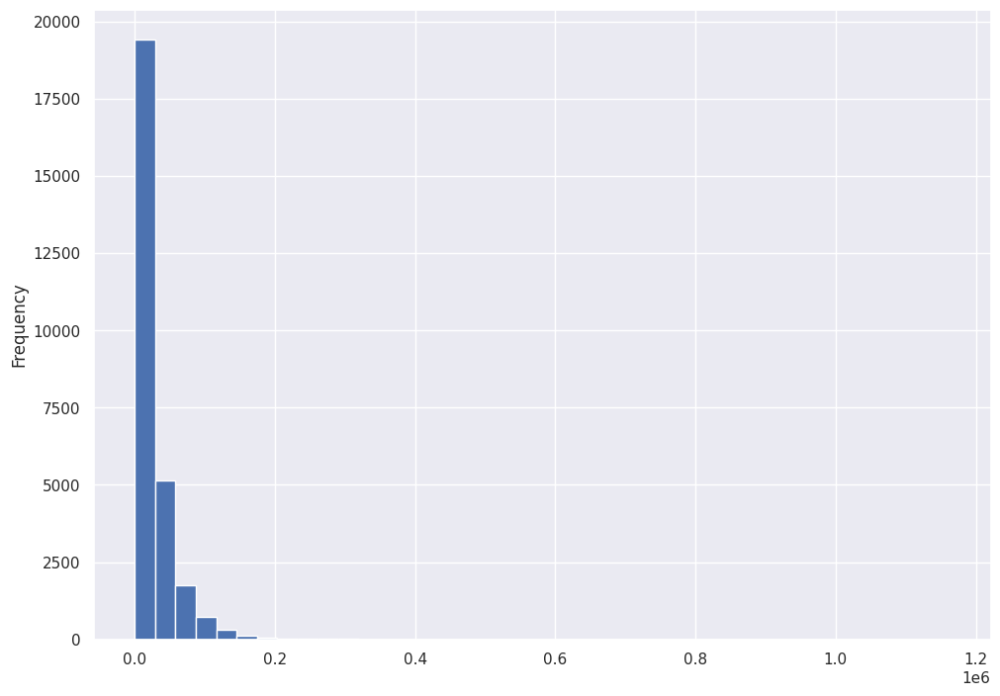

In [280]:
sample22['dens_22'].plot.hist(bins=40)

<Axes: >

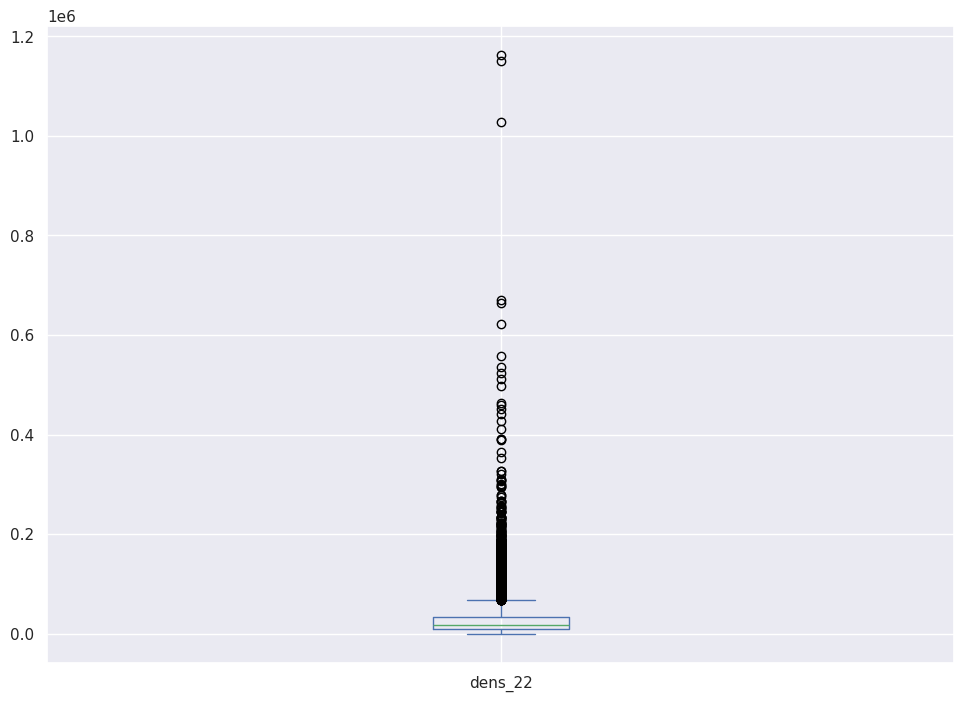

In [281]:
sample22['dens_22'].plot.box()

<Axes: ylabel='Frequency'>

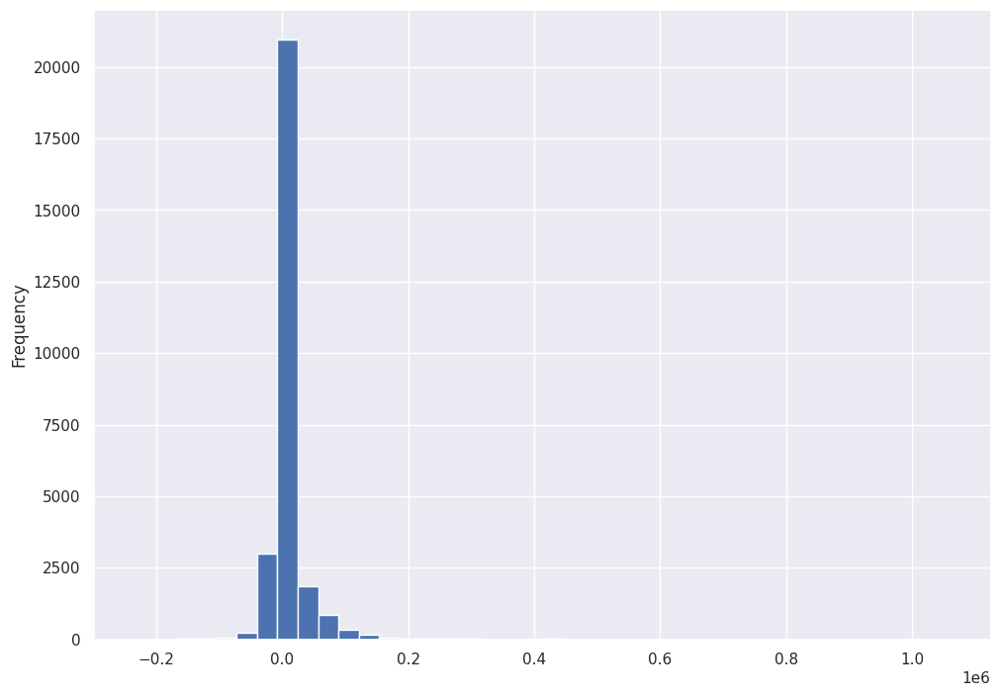

In [282]:
sample22['var_dens'].plot.hist(bins=40)

<Axes: >

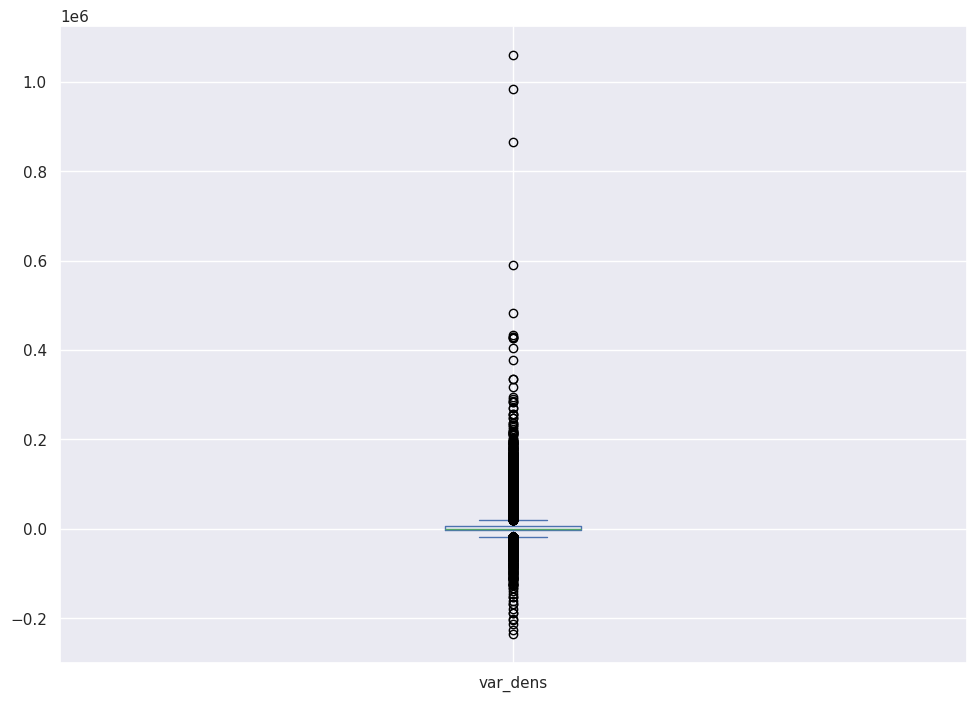

In [283]:
sample22['var_dens'].plot.box()

Para tentar reduzir a assimetria da variação na densidade, vamos tentar uma normalização com base na raiz cúbica (já que temos 0 e valores negativos na nossa distribuição).

In [284]:
sample22['cbrt_var_dens'] = np.cbrt(sample22['var_dens'])

<Axes: ylabel='Frequency'>

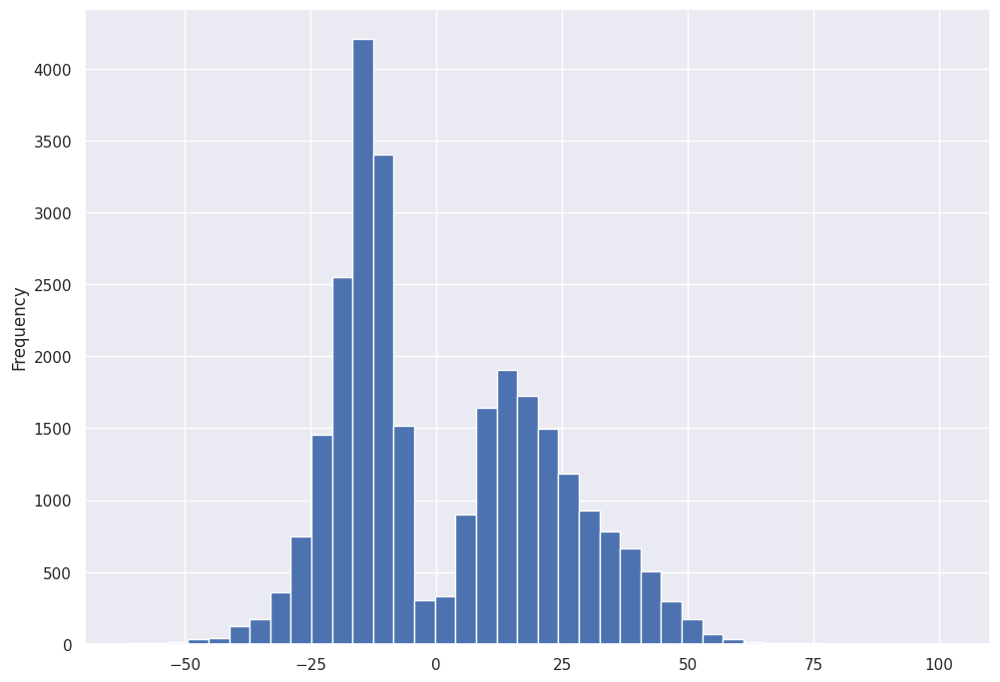

In [285]:
sample22['cbrt_var_dens'].plot.hist(bins=40)

<Axes: >

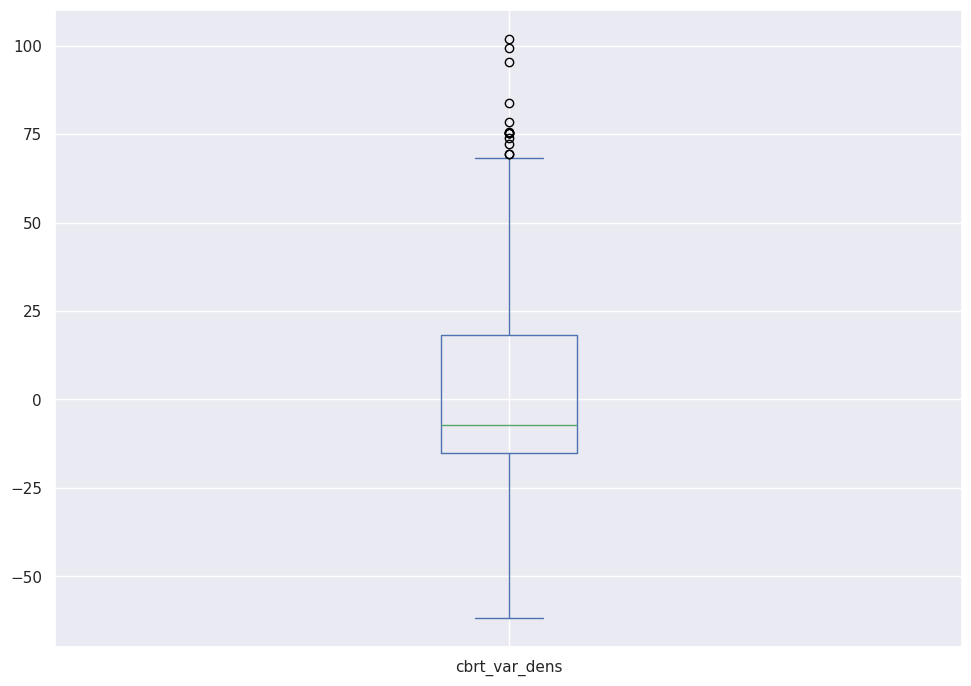

In [286]:
sample22['cbrt_var_dens'].plot.box()

A distribuição melhorou, mas ainda possui uma quantidade razoável de outliers na cauda direita. Outro ponto importante é que a normalização pela raiz cúbica torna a distribuição bimodal.

Por último, vou criar uma outras versões da coluna de variação da densidade deslocada para a direita, uma em valores absolutos e a outra normalizada pelo logaritmo.

In [287]:
sample22['log_var_dens'] = sample22['var_dens'] - sample22['var_dens'].min() + 1
sample22['log_var_dens'] = np.log(sample22['log_var_dens'])
sample22.head()

,CD_SETOR,AREA_KM2,CD_REGIAO,NM_REGIAO,CD_UF,NM_UF,CD_MUN,NM_MUN,CD_DIST,NM_DIST,...,geometry,pop_total_prev,dom_total_prev,var_pop,var_pop_perc,var_pop_perc_str,var_dens,dens_22,cbrt_var_dens,log_var_dens
0,355030801000001P,0.071797,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,"POLYGON ((339819.409 7392592.743, 339817.380 7...",806.0,268.0,-124.0,-15.384615,-15.38%,-1727.091661,9499.004137,-11.997897,12.358497
1,355030801000002P,0.071902,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,"POLYGON ((339965.618 7393034.241, 339934.552 7...",913.0,306.0,461.0,50.492881,50.49%,6411.504548,19109.343273,18.577474,12.392841
2,355030801000003P,0.055681,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,"POLYGON ((340157.893 7392942.288, 340105.133 7...",625.0,189.0,-68.0,-10.880000,-10.88%,-1221.242435,10003.412295,-10.688923,12.360667
3,355030801000004P,0.064905,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,"POLYGON ((339898.252 7392661.977, 339885.527 7...",561.0,178.0,-35.0,-6.238859,-6.24%,-539.249673,8104.152222,-8.139479,12.363584
4,355030801000005P,0.086820,3,Sudeste,35,São Paulo,3550308,São Paulo,355030801,Água Rasa,...,"POLYGON ((339650.828 7392494.453, 339535.589 7...",767.0,245.0,-188.0,-24.511082,-24.51%,-2165.399677,6668.970283,-12.937371,12.356614


# Estimando a variação na densidade populacional para os setores de 2010

In [156]:
sample10['AREA_KM2']=sample10.area/1e6

In [158]:
sample10['var_dens'] = sample10['var_pop']/sample10['AREA_KM2']
sample10['dens_10'] = sample10['pop_total_prev']/sample10['AREA_KM2']
sample10

,ID,CD_GEOCODI,TIPO,CD_GEOCODS,NM_SUBDIST,CD_GEOCODD,NM_DISTRIT,CD_GEOCODM,NM_MUNICIP,NM_MICRO,...,pop_total,dom_total,var_pop,var_pop_perc,var_pop_perc_str,var_index,AREA_KM2,var_dens,dens_22,dens_10
0,109347.0,355030804000079,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,421,205,-133,-24.007220,-24.01%,-3192.960289,0.035855,-3709.371960,11741.696204,15451.068164
1,109348.0,355030804000080,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,639,288,-74,-10.378682,-10.38%,-768.022440,0.036307,-2038.200233,17600.134442,19638.334674
2,109349.0,355030804000081,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,574,238,-111,-16.204380,-16.20%,-1798.686131,0.022270,-4984.335696,25774.853059,30759.188756
3,109350.0,355030804000082,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,689,322,-213,-23.614191,-23.61%,-5029.822616,0.036717,-5801.077150,18764.986648,24566.063798
4,109351.0,355030804000083,URBANO,35503080400,None,355030804,ARICANDUVA,3550308,SÃO PAULO,SÃO PAULO,...,628,241,26,4.318937,4.32%,112.292359,0.029148,891.985344,21544.876759,20652.891416
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
18358,127887.0,355030896000243,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,359,131,23,6.845238,6.85%,157.440476,0.010238,2246.438688,35063.977777,32817.539090
18359,127888.0,355030896000244,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,105,44,-104,-49.760766,-49.76%,-5175.119617,0.008921,-11658.205741,11770.303873,23428.509614
18360,127889.0,355030896000245,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,372,125,33,9.734513,9.73%,321.238938,0.011073,2980.292073,33596.019730,30615.727657
18361,127890.0,355030896000246,URBANO,35503089600,None,355030896,LAJEADO,3550308,SÃO PAULO,SÃO PAULO,...,232,77,69,42.331288,42.33%,2920.858896,0.008112,8505.517424,28598.261485,20092.744061


# Criando e salvando os mapas interativos

In [31]:
def create_map(df:gpd.GeoDataFrame, col_mapper:dict, legend_column:str, base:str='2022', **kwargs) -> folium.Map:
    
    df = df[[k for k in col_mapper]].copy()
    # df = df[df['pop_total'].astype(int) > 0]
    df = df.rename(columns=col_mapper)
    if base == '2022':
        m = setores10[['CD_GEOCODI', 'pop_total', 'geometry']].explore(
            tiles="CartoDB positron",  # use "CartoDB positron" tiles
            name='Setores censitários (2010)',
            color='grey',
            style_kwds={'fillOpacity': 0.1},
        )
        
        m = est_2010[['CD_SETOR', 'CD_GEOCODI', 'pop_total', 'geometry']].explore(
            m=m,
            name='Similaridades',
            color='grey',
            style_kwds={'fillOpacity': 0.1},
            show=False,
        )
    
        m = setores22[['geometry']].dissolve().explore(
            m=m,
            name='Limite municipal',
            color='black',
            style_kwds={'fill': False},
        )
    elif base == '2010':
        m = setores22[['CD_SETOR', 'pop_total', 'geometry']].explore(
            tiles="CartoDB positron",  # use "CartoDB positron" tiles
            name='Setores censitários (2022)',
            color='grey',
            style_kwds={'fillOpacity': 0.1},
        )
        
        m = est_2022[['CD_GEOCODI', 'CD_SETOR', 'pop_total', 'geometry']].explore(
            m=m,
            name='Similaridades',
            color='grey',
            style_kwds={'fillOpacity': 0.1},
            show=False,
        )
    
        m = setores10[['geometry']].dissolve().explore(
            m=m,
            name='Limite municipal',
            color='black',
            style_kwds={'fill': False},
        )

    defaultKwargs = {
        'scheme': 'quantiles',
        'cmap': 'coolwarm',
        'k': 10
    }
    kwargs = { **defaultKwargs, **kwargs }

        
    m = df.explore(
        m=m,
        column=legend_column,  # make choropleth based on "POP2010" column
        legend=True,  # show legend
        tooltip=['Setor censitário', 'Distrito', 'População total (2010)', 'População total (2022)', 'Variação populacional (absoluta)', 'Variação populacional (%)'],  # show popup (on-click)
        popup=['Setor censitário', 'Distrito', 'População total (2010)', 'População total (2022)', 'Variação populacional (absoluta)', 'Variação populacional (%)'],  # show popup (on-click)
        # legend_kwds=dict(colorbar=True, scale=False),  # do not use colorbar
        legend_kwds=dict(colorbar=False),  # do not use colorbar
        name='Variação populacional (%)',  # name of the layer in the map,
        **kwargs
    )
    
    folium.LayerControl().add_to(m)

    folium_plugins.Fullscreen(
        position='topright',
        title='Tela cheia',
        title_cancel='Exit me',
        force_separate_button=True,
    ).add_to(m)

    return m

In [114]:
mapper_22 = {
    'CD_SETOR': 'Setor censitário',
    'NM_DIST': 'Distrito',
    'pop_total': 'População total (2022)',
    'pop_total_prev': 'População total (2010)',
    'var_pop': 'Variação populacional (absoluta)',
    'var_pop_perc': 'Variação populacional (percentual)',
    'var_pop_perc_str': 'Variação populacional (%)',
    'var_dens': 'Variação na densidade demográfica (hab/km^2)',
    'dens_22': 'Densidade demográfica (hab/km^2)',
    'geometry': 'geometry'
}

In [33]:
m = create_map(sample22, mapper_22, 'Variação populacional (percentual)')

/home/d855395/git/compatibilizacao-setores-censitarios/env/lib/python3.12/site-packages/mapclassify/classifiers.py:939: RuntimeWarning: invalid value encountered in subtract
  css = yc - yc.mean()
/home/d855395/git/compatibilizacao-setores-censitarios/env/lib/python3.12/site-packages/mapclassify/classifiers.py:969: RuntimeWarning: invalid value encountered in scalar divide
  gadf = 1 if adam == 0 else 1 - self.adcm / adam


In [34]:
m.save('plots/Variação Populacional - Setores 2022.html')

In [35]:
m = create_map(sample22, mapper_22, 'Variação populacional (absoluta)')

In [36]:
m.save('plots/Variação Populacional Absoluta - Setores 2022.html')

In [37]:
mapper_10 = {
    'CD_GEOCODI': 'Setor censitário',
    'NM_DISTRIT': 'Distrito',
    'pop_total': 'População total (2022)',
    'pop_total_prev': 'População total (2010)',
    'var_pop': 'Variação populacional (absoluta)',
    'var_pop_perc': 'Variação populacional (percentual)',
    'var_pop_perc_str': 'Variação populacional (%)',
    'geometry': 'geometry'
}

m = create_map(sample10, mapper_10, 'Variação populacional (percentual)', base='2010')

In [38]:
m.save('plots/Variação Populacional - Setores 2010.html')

In [39]:
m = create_map(sample10, mapper_10, 'Variação populacional (absoluta)', base='2010')

In [40]:
m.save('plots/Variação Populacional Absoluta - Setores 2010.html')

# Criando e salvando os mapas estáticos

## Variação da população

/home/d855395/git/compatibilizacao-setores-censitarios/env/lib/python3.12/site-packages/mapclassify/classifiers.py:939: RuntimeWarning: invalid value encountered in subtract
  css = yc - yc.mean()
/home/d855395/git/compatibilizacao-setores-censitarios/env/lib/python3.12/site-packages/mapclassify/classifiers.py:969: RuntimeWarning: invalid value encountered in scalar divide
  gadf = 1 if adam == 0 else 1 - self.adcm / adam


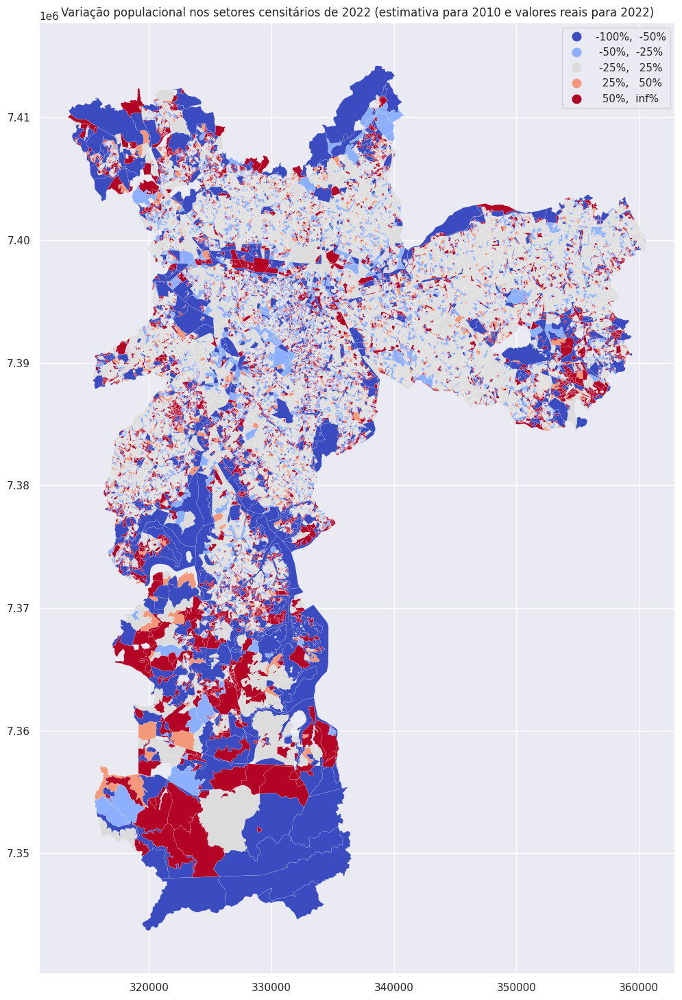

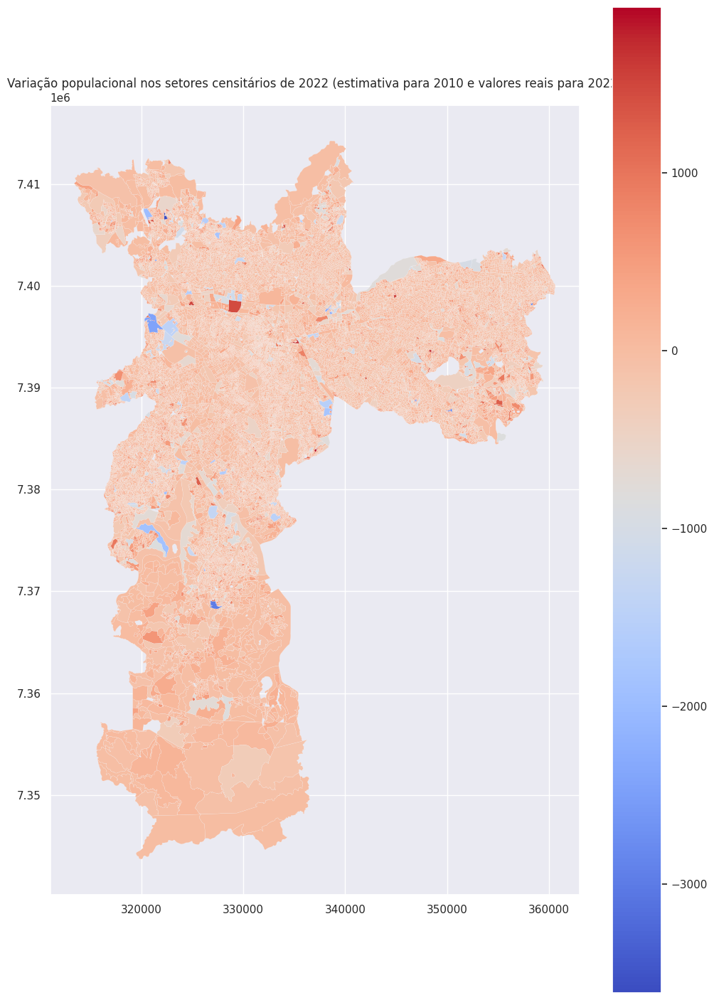

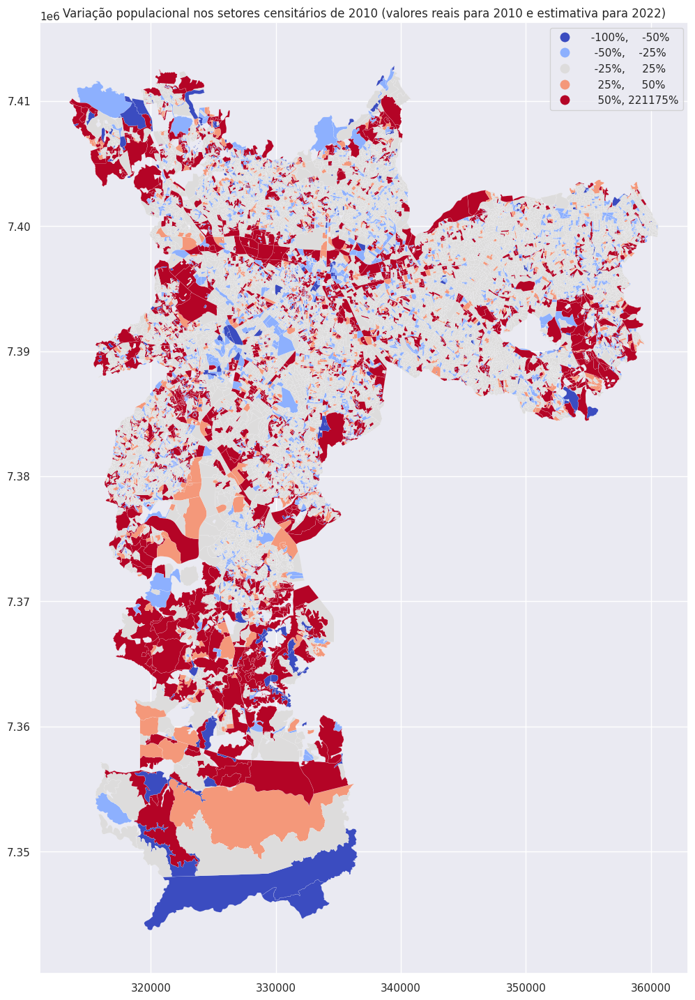

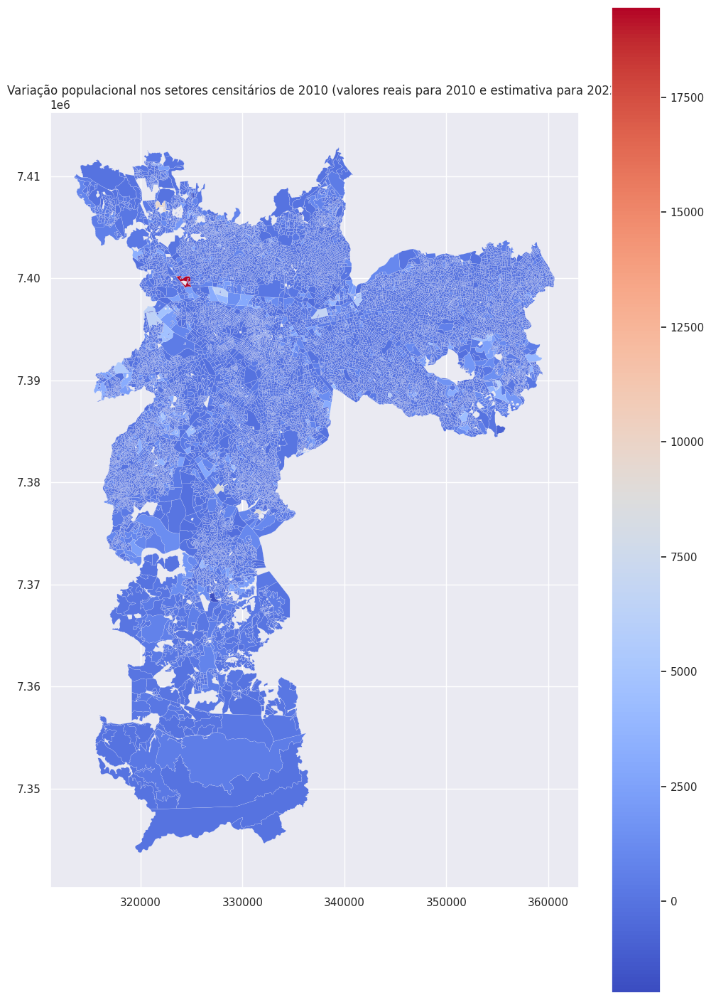

In [109]:
for df, title in zip([sample22.rename(columns=mapper_22), sample10.rename(columns=mapper_10)],
                     [
                         'Variação populacional nos setores censitários de 2022 (estimativa para 2010 e valores reais para 2022)',
                         'Variação populacional nos setores censitários de 2010 (valores reais para 2010 e estimativa para 2022)'
                     ]) :

    common_args = dict(
        cmap='coolwarm',
        legend=True,
        linewidth=0.1,
        figsize=(12, 18),
    )
    
    ax = df.plot(
        column='Variação populacional (percentual)',
        scheme='userdefined',
        # k = 10,
        classification_kwds={'bins':[-50, -25, 25, 50]},
        legend_kwds={"loc": "upper right", "fmt": "{:.0f}%"},
        **common_args
    )
    
    ax.set_title(title)
    filename = title.split('(')[0][:-1]
    plt.savefig(f'plots/{title}.png')
    
    
    ax = df.plot(
        column='Variação populacional (absoluta)',
        # scheme='stdmean',
        # k = 10,
        # legend_kwds={"loc": "upper right", "fmt": "{:.0f}"},
        **common_args
    )
    
    ax.set_title(title)
    filename = title.split('(')[0][:-1]
    plt.savefig(f'plots/{title} - variação absoluta.png')

## Variação na densidade populacional

### Tentativa inicial, escala contínua

Antes de mais nada, vamos tentar visualizar a variação populacional em escala contínua.

<Axes: >

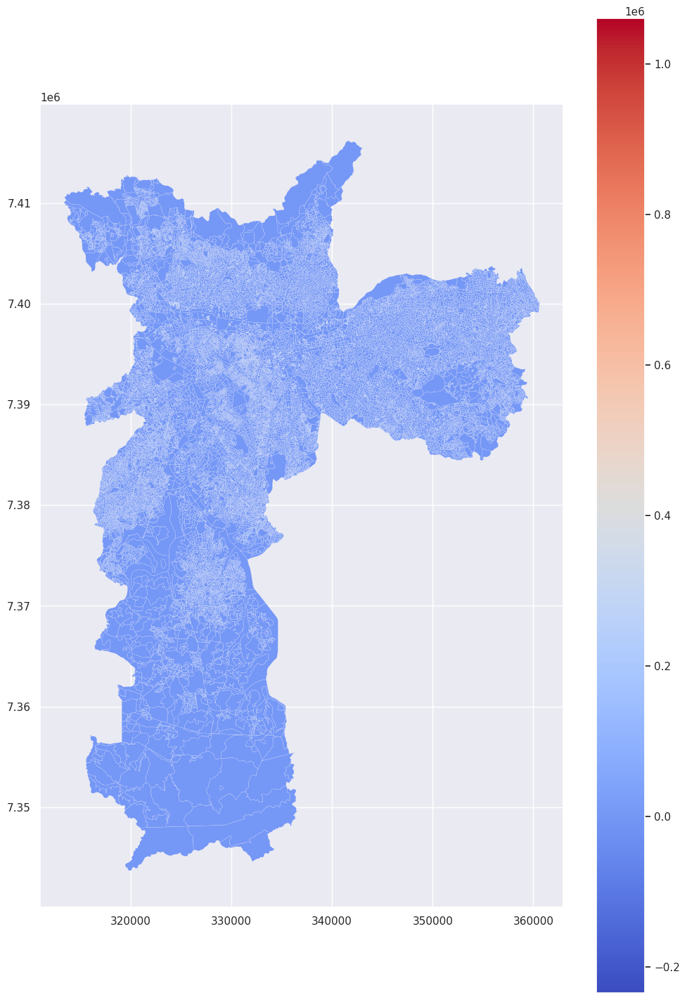

In [288]:
sample22.plot(
    column='var_dens',
    cmap='coolwarm',
    legend=True,
    linewidth=0.1,
    figsize=(12, 18),
)

Ou é algum tipo de falha, ou a presença de outliers faz com que a maioria dos setores censitários sejam exibinos na mesma faixa de cor. Vamos tentar as versões normalizadas da variação.

<Axes: >

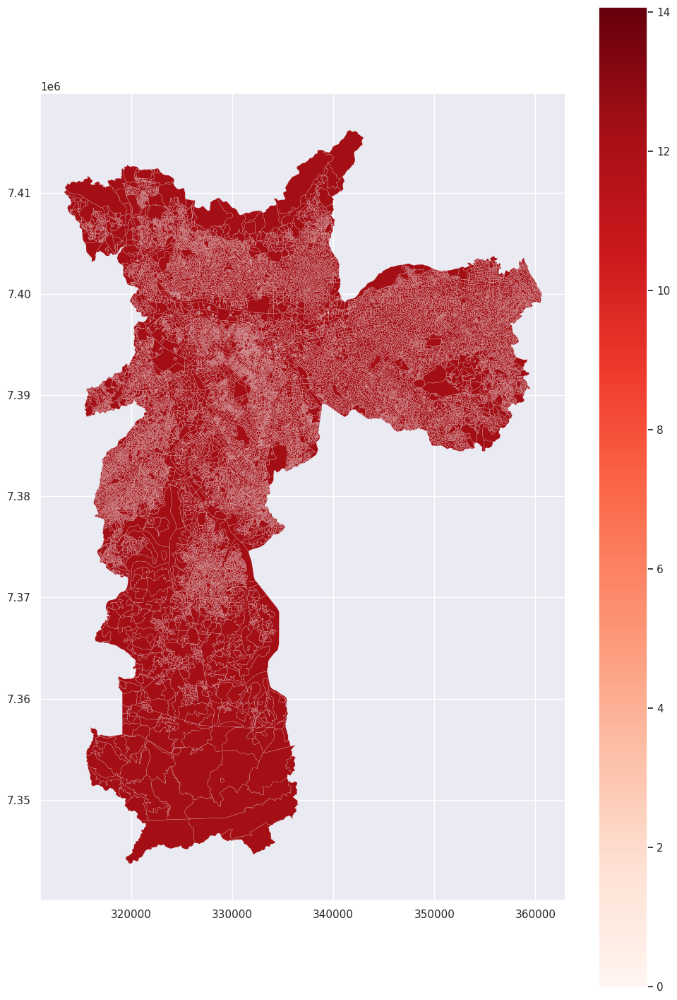

In [289]:
sample22.plot(
    column='log_var_dens',
    cmap='Reds',
    legend=True,
    linewidth=0.1,
    figsize=(12, 18),
)

<Axes: >

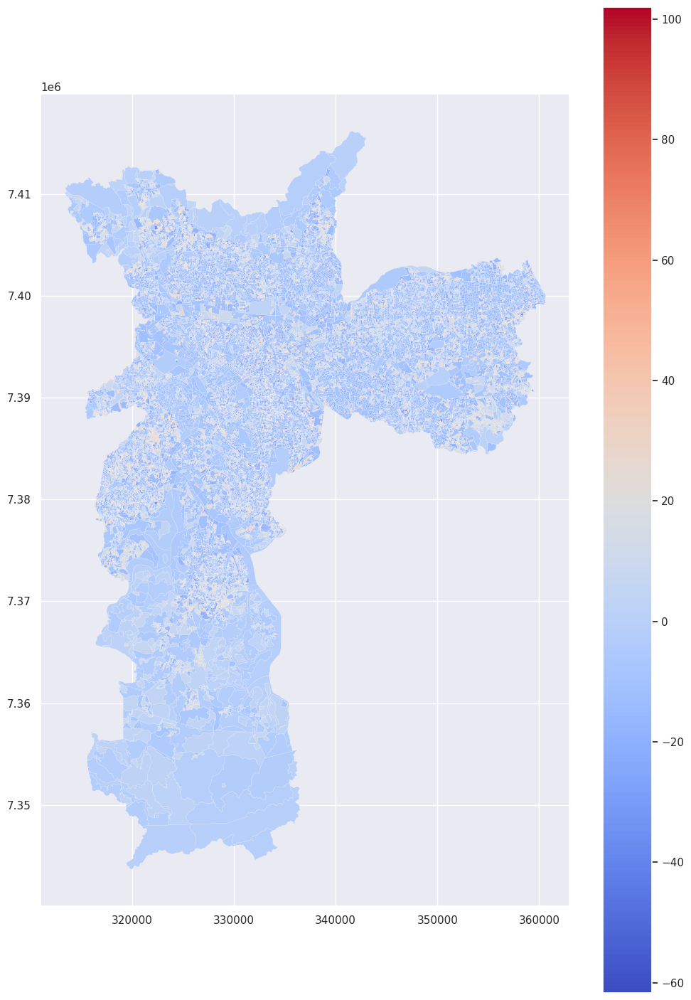

In [291]:
sample22.plot(
    column='cbrt_var_dens',
    cmap='coolwarm',
    legend=True,
    linewidth=0.1,
    figsize=(12, 18),
)

As variações de cores ainda não parecem boas o suficiente. Vamos tentar visualizar apenas um distrito para testar se é um problema da biblioteca.

In [304]:
sample_dist = sample22['CD_DIST'].sample(1).iloc[0]

<Axes: >

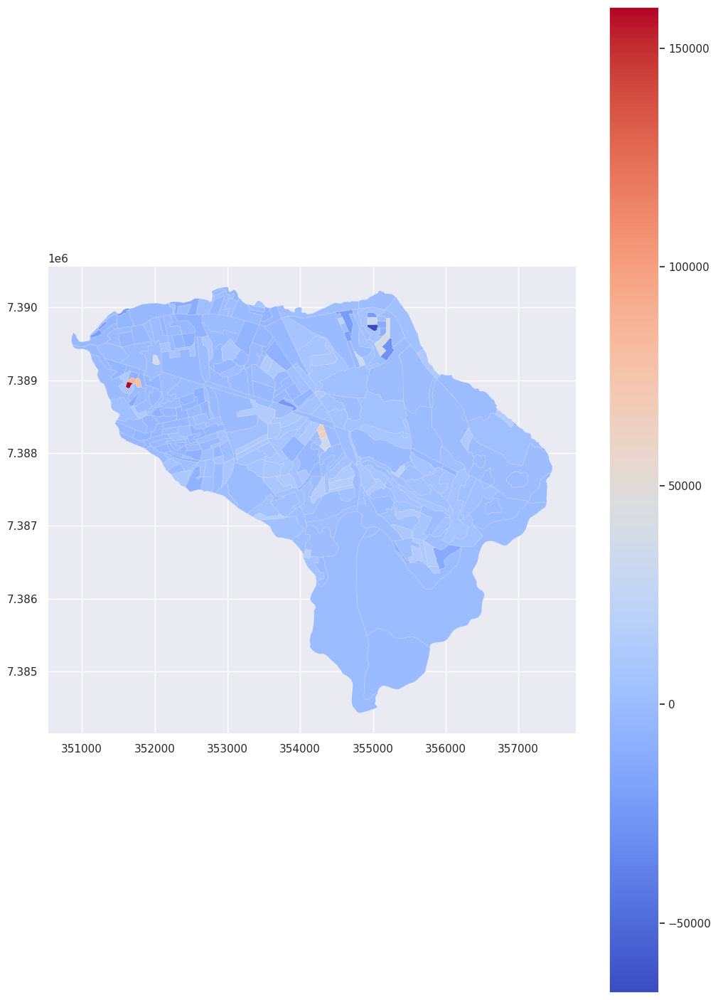

In [308]:
sample22.query(f'CD_DIST == "{sample_dist}"').plot(
    column='var_dens',
    cmap='coolwarm',
    legend=True,
    linewidth=0.1,
    figsize=(12, 18),
)

<Axes: >

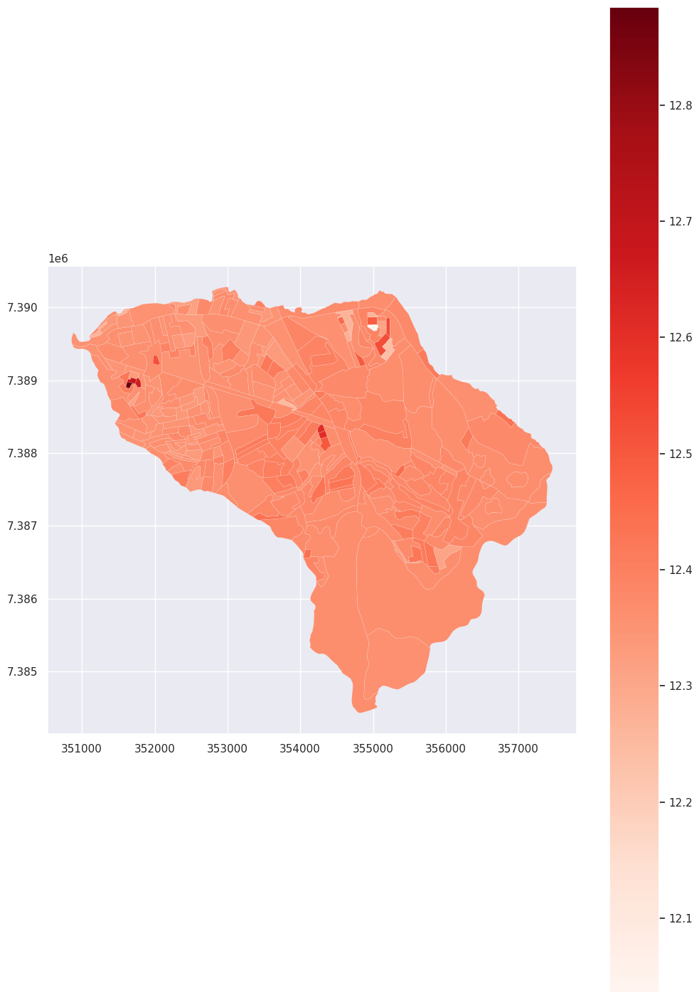

In [306]:
sample22.query(f'CD_DIST == "{sample_dist}"').plot(
    column='log_var_dens',
    cmap='Reds',
    legend=True,
    linewidth=0.1,
    figsize=(12, 18),
)

<Axes: >

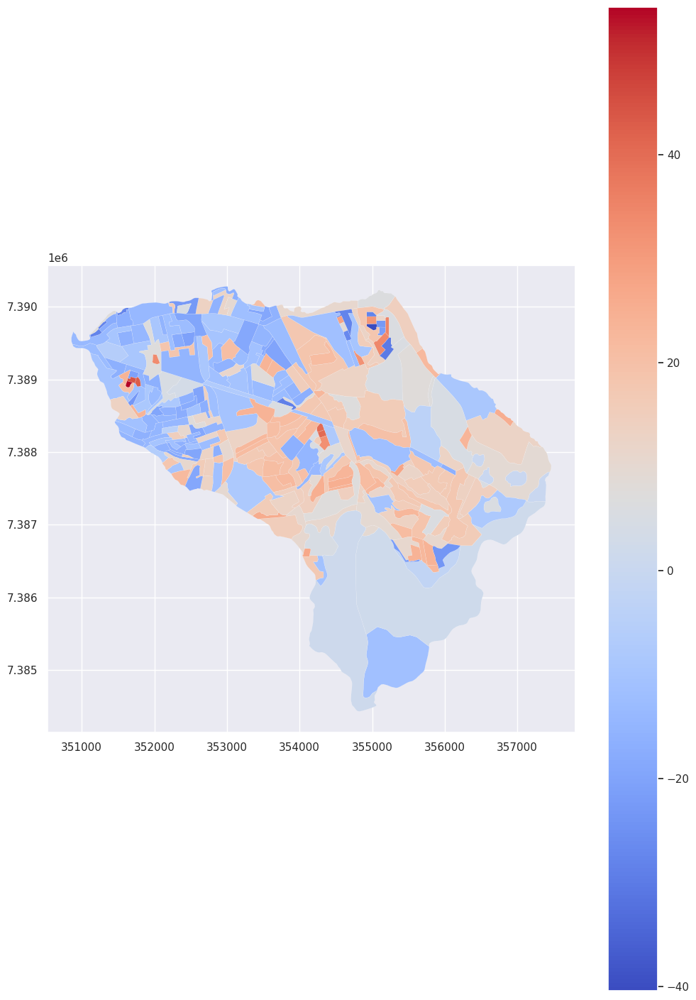

In [307]:
sample22.query(f'CD_DIST == "{sample_dist}"').plot(
    column='cbrt_var_dens',
    cmap='coolwarm',
    legend=True,
    linewidth=0.1,
    figsize=(12, 18),
)

De fato, fica evidente que existe variação entre as geometrias, mas existem valores tão extremos, principalmente em geometrias pequenas, que torna os valores intermediários muito próximos

As alternativas que parecem possíveis são a utilização de geometrias maiores ou a categorização da coluna. Por ora, tentarei essa segunda alternativa.

### Categorização

Vale notar que, neste caso, como as transformações para a normalização da variação na densidade são tranformações monotônicas, a categorização provavelmente se manterá igual variáveis normalizadas.
Assim, podemos avaliar apenas a variação na densidade populacional sem nenhuma transformação.

Dentre todas disponívels na geopandas, as classificações *JenksCaspall* e *quantílica* parecem funcionar melhor. Vamos compará-las lado a lado.

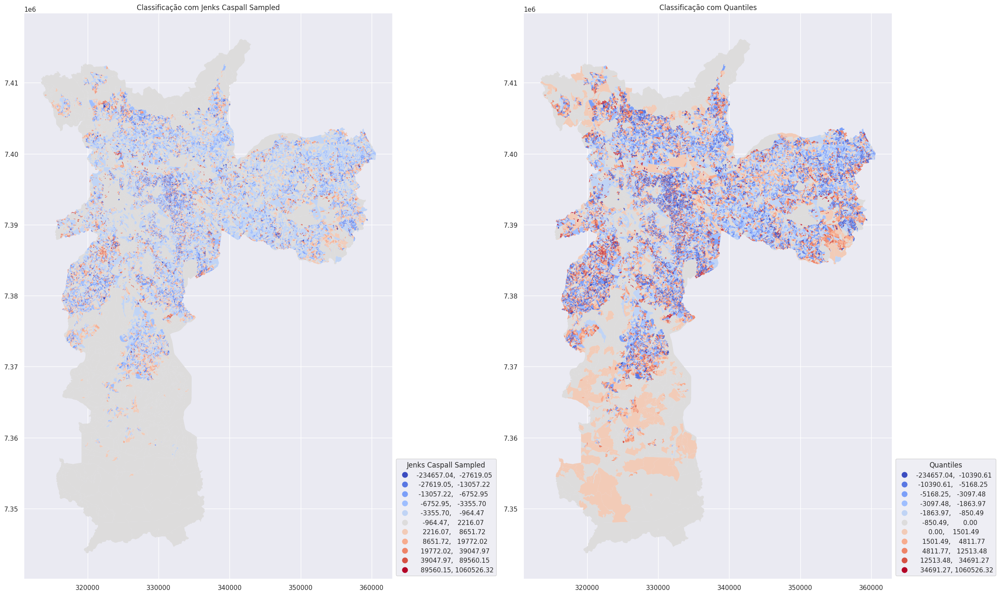

In [337]:
k=11

# Plotar os mapas lado a lado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 18))

# Mapa com 'JenksCaspallSampled'
sample22.plot(column='var_dens', ax=ax1, cmap='coolwarm', scheme='JenksCaspallSampled', k=k, legend=True, linewidth=0.01,
         legend_kwds={'title': 'Jenks Caspall Sampled',
                      'loc': 'lower left', 'bbox_to_anchor': (1, 0)})
ax1.set_title('Classificação com Jenks Caspall Sampled')

# Mapa com 'Quantiles'
sample22.plot(column='var_dens', ax=ax2, cmap='coolwarm', scheme='Quantiles', k=k, legend=True, linewidth=0.01,
         legend_kwds={'title': 'Quantiles',
                      'loc': 'lower left', 'bbox_to_anchor': (1, 0)})
ax2.set_title('Classificação com Quantiles')

# Mostrar os mapas
plt.tight_layout()
plt.show()

A classificação por quantis parece ter funcionado melhor, mas as quedas e aumentos populacionais ainda parecem muito mescladas. Vamos tentar avaliar com os setores censitários de 2010.

### Setores censitários de 2010

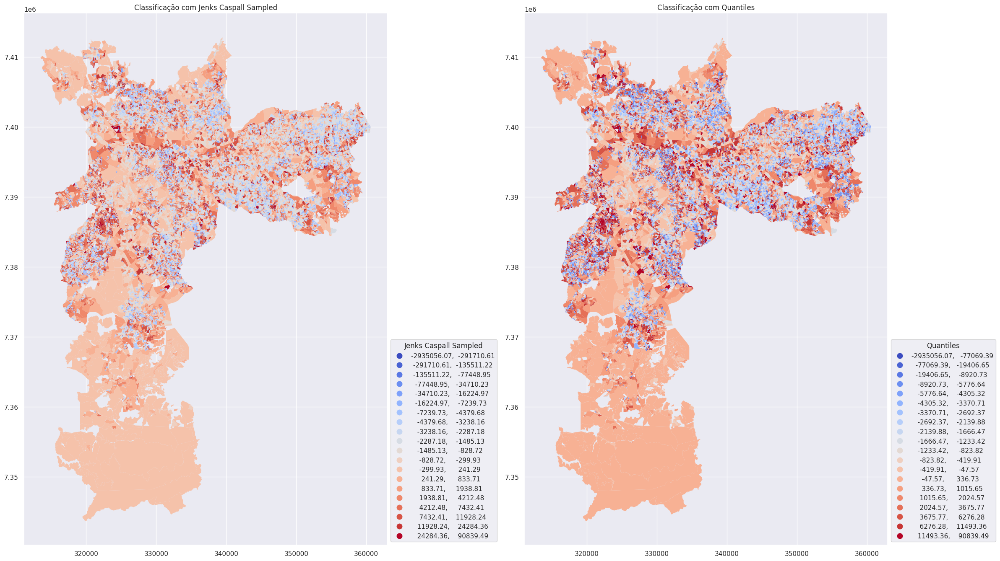

In [345]:
k=20

# Plotar os mapas lado a lado
fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(24, 18))

# Mapa com 'JenksCaspallSampled'
sample10.plot(column='var_dens', ax=ax1, cmap='coolwarm', scheme='jenkscaspallsampled', k=k, legend=True, linewidth=0.01,
         legend_kwds={'title': 'Jenks Caspall Sampled',
                      'loc': 'lower left', 'bbox_to_anchor': (1, 0)})
ax1.set_title('Classificação com Jenks Caspall Sampled')

# Mapa com 'Quantiles'
sample10.plot(column='var_dens', ax=ax2, cmap='coolwarm', scheme='Quantiles', k=k, legend=True, linewidth=0.01,
         legend_kwds={'title': 'Quantiles',
                      'loc': 'lower left', 'bbox_to_anchor': (1, 0)})
ax2.set_title('Classificação com Quantiles')

# Mostrar os mapas
plt.tight_layout()
plt.show()